In [1]:
import pandas as pd
import glob
import os

In [2]:
# =====================================================================
# 首先，定义我们的“领域停用词”列表
# =====================================================================
'''
停用词主要用于过滤掉那些过于通用、频繁出现但对具体研究领域没有实际意义的关键词。
这些词汇往往是描述性或背景性的，不能帮助我们识别出真正的研究热点或趋势。
通过去除这些停用词，我们可以更清晰地聚焦于那些真正反映特定研究领域的关键词，从而提高分析的准确性和有效性。
'''
domain_stop_words = [
    # ============== 常见通用生物体/人群标签 ==============
    'Humans', 'Animals', 'human', 'animal',
    'Female', 'female', 'Male', 'male',
    'Middle Aged',           # 中年人
    'Adult',                 # 成年人
    'Aged',                  # 老年人
    'Young Adult',           # 青年人
    'Adolescent',            # 青少年
    'Child',                 # 儿童
    'Aged, 80 and over',     # 80岁及以上老年人
    "Infant",                # 婴儿
    "Child, Preschool",      # 学龄前儿童
    "Infant, Newborn",       # 新生儿
    "East Asian People",     # 东亚人 (通常人群定义不作为热点)

    # ============== 常见研究类型/报告形式/方法学标签 ==============
    'Case Reports', 'patient', 'patients',
    'Retrospective Studies', 'Cross-Sectional Studies', 'Prospective Studies', # 研究类型
    'Surveys and Questionnaires', # 调查问卷
    'Case-Control Studies',       # 病例对照研究
    "Cohort Studies",             # 队列研究
    "Longitudinal Studies",       # 纵向研究
    "Follow-Up Studies",          # 随访研究
    "Reproducibility of Results", # 结果重现性 (科学研究的基本要求)
    "Nutrition Surveys",          # 营养调查 (属于方法学，而非具体研究内容)
    "ROC Curve",                  # ROC 曲线 (统计学评估工具)
    "meta-analysis",              # Meta分析 (统计学研究方法)
    "Xenograft Model Antitumor Assays", # 异种移植模型抗肿瘤试验 (具体的实验模型和方法)
    "Proportional Hazards Models",# 新增：比例风险模型 (统计学方法)

    # ============== 常见资金/机构/地理位置标签 ==============
    'Research Support, N.I.H., Extramural', # 基金或机构标签
    'United States', # 地理位置
    'United States/epidemiology', # 地理位置/流行病学
    'China','China/epidemiology', # 地理位置
    "Cities",                     # 城市 (过于通用，通常只作为背景)
    "NHANES",                     # 特定研究数据集

    # ============== 常见研究对象/模型/工具标签 ==============
    'Mice', 'Rats',   # 研究对象：小鼠、大鼠
    'Mice, Inbred C57BL', # C57BL近交系小鼠
    'Rats, Sprague-Dawley', # 斯普拉格-道利大鼠
    'Mice, Nude',             # 裸鼠
    "Mice, Inbred BALB C",    # BALB/c 近交系小鼠
    "Mice, Knockout",         # 基因敲除小鼠 (特定类型动物模型)
    'Cell Line, Tumor', # 肿瘤细胞系
    'Cells, Cultured',        # 培养细胞
    "Cell Line",              # 细胞系 (更通用的概念)

    # ============== 常见、宽泛的研究指标/概念/过程标签 ==============
    'Prognosis',            # 研究结果：预后
    'prognosis',            # 小写预后
    'Risk Factors',         # 研究概念：危险因素
    'Treatment Outcome',    # 研究结果：治疗结果
    'Incidence',            # 流行病学指标：发病率
    "Prevalence",           # 流行病学指标：患病率
    'Pregnancy', # 如果是妇产科，可能需要去掉
    'Apoptosis', # 细胞凋亡（如果其细分如 "/drug effects" 或 "/genetics" 更重要，则可作为停用词）
    'apoptosis', # 小写细胞凋亡
    'Disease Models, Animal', # 动物疾病模型（通用概念）
    'Signal Transduction',    # 信号转导（如果其细分如 "/drug effects" 更重要，则可作为停用词）
    'Cell Proliferation',     # 细胞增殖（如果其细分如 "/genetics" 或 "/drug effects" 更重要，则可作为停用词）
    "Inflammation",           # 炎症（作为非常宽泛的病理过程，如果想聚焦更具体的，可考虑停用）
    "inflammation",           # 小写炎症
    "Disease Progression",    # 疾病进展 (通用性质描述)
    "Time Factors",           # 时间因素 (过于泛化)
    "Risk Assessment",        # 风险评估 (通用管理概念)
    "Quality of Life",        # 生活质量 (通用健康结局指标)
    "Temperature",            # 温度 (除非特定领域才有意义)
    "body mass index",        # 身体质量指数
    "Body Mass Index",        # 身体质量指数
    "oxidative stress",       # 小写氧化应激 (保留大写形式为热点)
    "Genotype",               # 基因型 (基础概念)
    "Catalysis",              # 催化 (基础概念)
    "Phenotype",              # 表型 (基础概念)

    # ============== 在此列表中处理大小写不一致的词汇 ==============
    # 这些词汇我们会保留其有大写或更具体形式在后续分析中，此处只为处理小写重复
    "machine learning",
    "immunotherapy"
]
# 你可以根据你的数据不断完善这个列表！


## 读取数据文件，并且查看数据基本信息

In [3]:
# 定义数据文件路径
data_path = 'D:/MEDscience_map_of_XJTU/data/raw'
# 读取数据文件
df = pd.read_csv(os.path.join(data_path, 'zotero_data_combined.csv'))
# 查看数据的信息
print(df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25105 entries, 0 to 25104
Data columns (total 87 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Key                   25105 non-null  object 
 1   Item Type             25105 non-null  object 
 2   Publication Year      25105 non-null  int64  
 3   Author                25105 non-null  object 
 4   Title                 25105 non-null  object 
 5   Publication Title     25064 non-null  object 
 6   ISBN                  0 non-null      float64
 7   ISSN                  25063 non-null  object 
 8   DOI                   24969 non-null  object 
 9   Url                   0 non-null      float64
 10  Abstract Note         24183 non-null  object 
 11  Date                  25105 non-null  object 
 12  Date Added            25105 non-null  object 
 13  Date Modified         25105 non-null  object 
 14  Access Date           0 non-null      float64
 15  Pages              

C:\Users\tonyx\AppData\Local\Temp\ipykernel_18104\1082927335.py:4: DtypeWarning: Columns (18) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(os.path.join(data_path, 'zotero_data_combined.csv'))


In [4]:
# 查看数据的列名
print(df.columns)

Index(['Key', 'Item Type', 'Publication Year', 'Author', 'Title',
       'Publication Title', 'ISBN', 'ISSN', 'DOI', 'Url', 'Abstract Note',
       'Date', 'Date Added', 'Date Modified', 'Access Date', 'Pages',
       'Num Pages', 'Issue', 'Volume', 'Number Of Volumes',
       'Journal Abbreviation', 'Short Title', 'Series', 'Series Number',
       'Series Text', 'Series Title', 'Publisher', 'Place', 'Language',
       'Rights', 'Type', 'Archive', 'Archive Location', 'Library Catalog',
       'Call Number', 'Extra', 'Notes', 'File Attachments', 'Link Attachments',
       'Manual Tags', 'Automatic Tags', 'Editor', 'Series Editor',
       'Translator', 'Contributor', 'Attorney Agent', 'Book Author',
       'Cast Member', 'Commenter', 'Composer', 'Cosponsor', 'Counsel',
       'Interviewer', 'Producer', 'Recipient', 'Reviewed Author',
       'Scriptwriter', 'Words By', 'Guest', 'Number', 'Edition',
       'Running Time', 'Scale', 'Medium', 'Artwork Size', 'Filing Date',
       'Applicatio

## 第一步：数据“瘦身”，修改数据结构，删去不需要的列

根据我们的分析目标，以下这些列通常是最有价值的。我们先挑出它们：

- Author: 作者信息，核心中的核心。
- Title: 文章标题。
- Publication Title: 发表的期刊或会议名称。
- Publication Year: 发表年份，用于分析趋势。
- DOI: 文章的唯一数字标识符，用于精确去重。
- Abstract Note: 文章摘要，可以用于文本分析。
- Manual Tags / Automatic Tags: 关键词，用于分析研究热点。
- Pages: 页码。
- Volume: 卷。
- Issue: 期。

In [5]:
# 检查是否包含所有需要的列
# 定义需要的列
required_columns = [
    "Author",
    "Title",
    "Publication Title",
    "Publication Year",
    "DOI",
    "Abstract Note",
    "Manual Tags",
    "Automatic Tags",
    "Pages",
    "Volume",
    "Issue"
]
# 用于存储缺失列的列表
missing_columns = []
# 遍历所有需要的列，检查它们是否存在于 DataFrame 的列中
for col in required_columns:
    if col not in df.columns:
        missing_columns.append(col)
# 输出结果
if missing_columns:
    print("DataFrame中缺失以下列：")
    for col in missing_columns:
        print(f"- {col}")
else:
    print("DataFrame中存在所有必需的列。")

DataFrame中存在所有必需的列。


In [6]:
# 定义我们要保留的列和它们的新名字
# 这是一个字典，key是原始列名，value是我们的新列名
columns_to_keep = {
    'Author': 'authors',
    'Title': 'title',
    'Publication Title': 'journal',
    'Publication Year': 'year',
    'DOI': 'doi',
    'Abstract Note': 'abstract',
    'Manual Tags': 'manual_tags',
    'Automatic Tags': 'auto_tags',
    'Pages': 'pages',
    'Volume': 'volume',
    'Issue': 'issue'
}
# 从原始DataFrame中只选择我们需要的列
# 注意：df[list(columns_to_keep.keys())] 会选择出所有我们定义好的原始列
df_clean = df[list(columns_to_keep.keys())].copy()
# 对选出的新DataFrame进行重命名
df_clean = df_clean.rename(columns=columns_to_keep)
# --- 验证我们的成果 ---
print("清洗后的数据信息：")
df_clean.info()
print("\n清洗后的数据前5行预览：")
print(df_clean.head())

清洗后的数据信息：
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25105 entries, 0 to 25104
Data columns (total 11 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   authors      25105 non-null  object 
 1   title        25105 non-null  object 
 2   journal      25064 non-null  object 
 3   year         25105 non-null  int64  
 4   doi          24969 non-null  object 
 5   abstract     24183 non-null  object 
 6   manual_tags  22640 non-null  object 
 7   auto_tags    0 non-null      float64
 8   pages        22971 non-null  object 
 9   volume       24594 non-null  object 
 10  issue        17668 non-null  object 
dtypes: float64(1), int64(1), object(9)
memory usage: 2.1+ MB

清洗后的数据前5行预览：
                                             authors  \
0  Sun, Lei; Wang, Hua; Yu, Shanshan; Zhang, Lin;...   
1                Zhou, Lina; Ma, Xiancang; Wang, Wei   
2  Jin, Xuting; Ren, Jiajia; Li, Ruohan; Gao, Ya;...   
3  Feng, Wei; Wang, Jian; Yan, Xin;

## 第二步：处理缺失值和重复项

In [7]:
# 根据info()输出的信息发现：auto_tags列完全为空，因此我们决定丢弃这一列
# 丢弃 'auto_tags' 列
# inplace=True 表示直接在原始的 df_clean 上修改，而不是返回一个新DataFrame
df_clean.drop(columns=['auto_tags'], inplace=True)
print("已丢弃 'auto_tags' 列。")

已丢弃 'auto_tags' 列。


In [8]:
# 从 info() 看出，journal, doi, abstract, manual_tags 等列都有缺失值。对于这些本应是字符串的列，最好的处理方法是 用一个空字符串 '' 来填充 NaN。
# 找出所有数据类型为 'object' (通常是字符串) 的列
string_columns = df_clean.select_dtypes(include=['object']).columns
# 使用空字符串 '' 填充这些列中的所有 NaN 值
df_clean[string_columns] = df_clean[string_columns].fillna('')
# --- 验证我们的成果 ---
print("\n填充NaN后的数据信息：")
df_clean.info()


填充NaN后的数据信息：
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25105 entries, 0 to 25104
Data columns (total 10 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   authors      25105 non-null  object
 1   title        25105 non-null  object
 2   journal      25105 non-null  object
 3   year         25105 non-null  int64 
 4   doi          25105 non-null  object
 5   abstract     25105 non-null  object
 6   manual_tags  25105 non-null  object
 7   pages        25105 non-null  object
 8   volume       25105 non-null  object
 9   issue        25105 non-null  object
dtypes: int64(1), object(9)
memory usage: 1.9+ MB


核心步骤：处理重复项
这是至关重要的一步。我们通常使用 DOI (Digital Object Identifier) 作为论文的唯一身份证。

但是这里有一个巨大的陷阱！
我们刚刚把 NaN 的 doi 填充成了空字符串 ''。如果你直接对 doi 列去重，所有 doi 为空字符串 '' 的记录都会被认为是“重复”的，最终只会被保留一条，这将误删大量数据！

所以，我们必须采用更精确的策略：

有DOI的：按 doi 去重。
没有DOI的：按其他信息（如 title + year + authors）去重。

In [9]:
# 首先，报告一下有多少条记录的DOI是缺失的（现在是空字符串）
print(f"原始数据中，DOI为空的记录有 {len(df_clean[df_clean['doi'] == ''])} 条。")

原始数据中，DOI为空的记录有 136 条。


In [10]:
# 1. 处理有DOI的记录
#   - isin(['']) 是为了确保我们选中了空字符串
#   - ~ 符号是 "取反" 的意思，所以这里是选择 doi 不是空字符串的行
df_has_doi = df_clean[~df_clean['doi'].isin([''])].copy()
df_no_doi = df_clean[df_clean['doi'].isin([''])].copy()
# 对有DOI的部分进行去重
print(f"去重前，有DOI的记录数: {len(df_has_doi)}")
df_has_doi.drop_duplicates(subset=['doi'], keep='first', inplace=True)
print(f"去重后，有DOI的记录数: {len(df_has_doi)}")

去重前，有DOI的记录数: 24969
去重后，有DOI的记录数: 22720


In [11]:
# 2. 处理没有DOI的记录
#    对于没有DOI的，我们使用一个更严格的标准：标题、年份和作者列表都得一样才算重复
print(f"\n去重前，无DOI的记录数: {len(df_no_doi)}")
df_no_doi.drop_duplicates(subset=['title', 'year', 'authors'], keep='first', inplace=True)
print(f"去重后，无DOI的记录数: {len(df_no_doi)}")


去重前，无DOI的记录数: 136
去重后，无DOI的记录数: 134


In [12]:
# 3. 将处理好的两部分数据重新合并起来
df_final = pd.concat([df_has_doi, df_no_doi], ignore_index=True)
# --- 最终验证 ---
print(f"\n所有数据去重完成！最终剩余 {len(df_final)} 条有效记录。")
print("\n最终数据集信息：")
df_final.info()
# 现在，df_clean 可以被 df_final 覆盖，或者你后面一直使用 df_final
df_clean = df_final


所有数据去重完成！最终剩余 22854 条有效记录。

最终数据集信息：
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22854 entries, 0 to 22853
Data columns (total 10 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   authors      22854 non-null  object
 1   title        22854 non-null  object
 2   journal      22854 non-null  object
 3   year         22854 non-null  int64 
 4   doi          22854 non-null  object
 5   abstract     22854 non-null  object
 6   manual_tags  22854 non-null  object
 7   pages        22854 non-null  object
 8   volume       22854 non-null  object
 9   issue        22854 non-null  object
dtypes: int64(1), object(9)
memory usage: 1.7+ MB


## 第三步：规范化与解析作者信息

目标：将原始的、单一字符串格式的作者信息（如 "Jin, Xuting; Ren, Jiajia; Li, Ruohan"），转换成一个程序可用的、标准化的作者列表（如 ['Jin X', 'Ren J', 'Li R']）。

- 唯一性识别：不经过处理，"Jin, Xuting" 和 "Xuting Jin" 会被程序当成两个人。标准化后（如都变成 "Jin X"），我们才能准确地统计每个作者的发文数量。
- 网络分析基础：合作网络是基于作者的。我们需要一个干净的作者列表，才能知道哪些作者共同出现在一篇文章里，从而构建出合作关系。
- 可计算性：字符串是没法直接计算的，但列表可以。转换后，我们可以轻松计算每篇文章的作者数量，或者找出第一作者/通讯作者（如果信息可用）。

我们将创建一个小函数，它的任务是接收一个作者名（如 "Jin, Xuting"），然后返回一个标准格式（如 "Jin X"）。这个标准格式（姓 + 名首字母）在学术分析中非常通用和有效。

In [13]:
def standardize_author_name(name):
    """
    将单个作者姓名标准化为 'Lastname F.' 的格式。
    例如：'Jin, Xuting' -> 'Jin X'
           'Xuting Jin' -> 'Jin X'
    """
    name = name.strip()  # 去除首尾的空格
    if not name:
        return None  # 如果是空字符串，返回None

    # 情况1: 'Lastname, Firstname' 格式
    if ',' in name:
        parts = name.split(',', 1) # 只分割一次
        last_name = parts[0].strip()
        first_name = parts[1].strip()
        if first_name:
            return f"{last_name} {first_name[0]}"
        else:
            return last_name # 只有姓的情况
    
    # 情况2: 'Firstname Lastname' 格式
    else:
        parts = name.split()
        if len(parts) > 1:
            last_name = parts[-1].strip()
            first_name = parts[0].strip()
            return f"{last_name} {first_name[0]}"
        else:
            # 只有一个词的名字 (比如一个机构名误入)
            return name

# --- 测试一下我们的函数 ---
print(f"'Jin, Xuting' -> '{standardize_author_name('Jin, Xuting')}'")
print(f"' Wang, Hua ' -> '{standardize_author_name(' Wang, Hua ')}'")
print(f"'Lina Zhou'   -> '{standardize_author_name('Lina Zhou')}'")
print(f"'Elsevier'    -> '{standardize_author_name('Elsevier')}'") # 也能处理单个词

'Jin, Xuting' -> 'Jin X'
' Wang, Hua ' -> 'Wang H'
'Lina Zhou'   -> 'Zhou L'
'Elsevier'    -> 'Elsevier'


现在我们有了处理单个名字的工具，接下来就要把它应用到 authors 列的每一个单元格上。每个单元格都是由分号 ; 连接的多个作者名。

我们会创建一个新列，叫 authors_list，来存放处理好的作者列表。

In [14]:
# df_clean 是你上一步得到的最终DataFrame
def process_authors_string(authors_str):
    """
    处理整个作者字符串，返回一个标准化的作者列表。
    """
    if not authors_str or pd.isna(authors_str):
        return [] # 如果是空字符串或NaN，返回空列表

    authors_list_raw = authors_str.split(';')
    
    # 对列表中的每个名字应用标准化函数
    standardized_list = [standardize_author_name(name) for name in authors_list_raw]
    
    # 过滤掉处理失败的 None 值
    return [name for name in standardized_list if name is not None]

# 使用 .apply() 方法将这个函数应用到 'authors' 列的每一行
df_clean['authors_list'] = df_clean['authors'].apply(process_authors_string)

# --- 验证我们的成果 ---
# 查看新创建的列和原始列的对比
print("\n作者信息处理前后对比：")
print(df_clean[['authors', 'authors_list']].head())

# 检查一下某一行的数据
print("\n查看单行处理结果示例：")
print("原始数据:", df_clean.loc[0, 'authors'])
print("处理后:", df_clean.loc[0, 'authors_list'])



作者信息处理前后对比：
                                             authors  \
0  Sun, Lei; Wang, Hua; Yu, Shanshan; Zhang, Lin;...   
1                Zhou, Lina; Ma, Xiancang; Wang, Wei   
2  Jin, Xuting; Ren, Jiajia; Li, Ruohan; Gao, Ya;...   
3  Feng, Wei; Wang, Jian; Yan, Xin; Zhang, Qianqi...   
4  Shao, Can; Wang, Xiaomeng; Ma, Qingyan; Zhao, ...   

                                        authors_list  
0    [Sun L, Wang H, Yu S, Zhang L, Jiang J, Zhou Q]  
1                             [Zhou L, Ma X, Wang W]  
2  [Jin X, Ren J, Li R, Gao Y, Zhang H, Li J, Zha...  
3  [Feng W, Wang J, Yan X, Zhang Q, Chai L, Wang ...  
4              [Shao C, Wang X, Ma Q, Zhao Y, Yun X]  

查看单行处理结果示例：
原始数据: Sun, Lei; Wang, Hua; Yu, Shanshan; Zhang, Lin; Jiang, Jue; Zhou, Qi
处理后: ['Sun L', 'Wang H', 'Yu S', 'Zhang L', 'Jiang J', 'Zhou Q']


## 第四步：初步分析-统计高产作者

In [15]:
# df_clean 是你上一步得到的 DataFrame

# 使用 explode 将 authors_list 列中的每个列表展开成多行
# 每一行现在只对应一个作者
all_authors_series = df_clean['authors_list'].explode()

# --- 查看一下 explode 的效果 ---
print("--- explode() 效果预览 ---")
print("原始DataFrame的前两行 'authors_list':")
print(df_clean['authors_list'].head(2))
print("\nexplode() 之后的前10个元素:")
print(all_authors_series.head(10))


--- explode() 效果预览 ---
原始DataFrame的前两行 'authors_list':
0    [Sun L, Wang H, Yu S, Zhang L, Jiang J, Zhou Q]
1                             [Zhou L, Ma X, Wang W]
Name: authors_list, dtype: object

explode() 之后的前10个元素:
0      Sun L
0     Wang H
0       Yu S
0    Zhang L
0    Jiang J
0     Zhou Q
1     Zhou L
1       Ma X
1     Wang W
2      Jin X
Name: authors_list, dtype: object


In [16]:
# 使用 value_counts() 来统计每个独立作者出现的次数
author_counts = all_authors_series.value_counts()
# --- 查看统计结果 ---
print("\n\n--- 最高产作者 Top 20 ---")
print(author_counts.head(20))
# 将结果保存到一个新的 DataFrame 中，方便查看和后续使用
df_author_productivity = author_counts.reset_index()
df_author_productivity.columns = ['author', 'publication_count']
print("\n\n--- 存为DataFrame，方便后续分析 ---")
print(df_author_productivity.head())



--- 最高产作者 Top 20 ---
authors_list
Zhang Y    2707
Wang Y     2434
Li Y       2044
Wang J     1911
Wang X     1847
Zhang J    1660
Li J       1653
Liu Y      1532
Li X       1521
Zhang X    1384
Zhang L    1293
Wang Z     1183
Liu J      1167
Zhao Y     1080
Wang H     1078
Liu X      1052
Li Z       1040
Chen Y     1022
Zhang H    1008
Li H        973
Name: count, dtype: int64


--- 存为DataFrame，方便后续分析 ---
    author  publication_count
0  Zhang Y               2707
1   Wang Y               2434
2     Li Y               2044
3   Wang J               1911
4   Wang X               1847


## 第五步：分析研究热点-解析关键词

In [17]:
# df_clean 是我们一直在使用的 DataFrame

def process_tags_string(tags_str):
    """
    处理关键词字符串，返回一个干净的关键词列表。
    例如："Tag A; Tag B " -> ['Tag A', 'Tag B']
    """
    if not tags_str or pd.isna(tags_str):
        return []

    # 按分号分割，并用列表推导式去除每个标签前后的空格
    tags_list = [tag.strip() for tag in tags_str.split(';')]
    
    # 过滤掉可能产生的空字符串
    return [tag for tag in tags_list if tag]

# 创建一个新的 'tags_list' 列
df_clean['tags_list'] = df_clean['manual_tags'].apply(process_tags_string)

# --- 验证成果 ---
print("--- 关键词处理前后对比 ---")
# 使用 .loc 选择 non-empty 'manual_tags' 的行来展示
sample_tags = df_clean[df_clean['manual_tags'] != ''].head()
print(sample_tags[['manual_tags', 'tags_list']])


--- 关键词处理前后对比 ---
                                         manual_tags  \
0  Animals; Rats; Cell Line; mitochondrial dysfun...   
1  Humans; Aged; Depression; China/epidemiology; ...   
2  Incidence; Epidemiology; Mortality; Global bur...   
3  Male; Animals; Rats; Rats, Sprague-Dawley; Cel...   
4  Adolescent; Child; Female; Humans; Risk Factor...   

                                           tags_list  
0  [Animals, Rats, Cell Line, mitochondrial dysfu...  
1  [Humans, Aged, Depression, China/epidemiology,...  
2  [Incidence, Epidemiology, Mortality, Global bu...  
3  [Male, Animals, Rats, Rats, Sprague-Dawley, Ce...  
4  [Adolescent, Child, Female, Humans, Risk Facto...  


### 热点分析1.0版本

In [18]:
# 1. 展开 (explode) 'tags_list' 列
all_tags_series = df_clean['tags_list'].explode()

# 2. 计数 (value_counts)
tag_counts = all_tags_series.value_counts()

# --- 查看统计结果 ---
print("\n\n--- 研究热点关键词 Top 20 ---")
print(tag_counts.head(20))

# 同样，存为 DataFrame 方便后续使用
df_hot_topics = tag_counts.reset_index()
df_hot_topics.columns = ['tag', 'count']

print("\n\n--- 存为DataFrame，方便后续分析 ---")
print(df_hot_topics.head())




--- 研究热点关键词 Top 20 ---
tags_list
Humans                     10041
Female                      3769
Male                        3689
Animals                     3657
Mice                        2230
Middle Aged                 1979
Adult                       1901
Aged                        1585
Retrospective Studies       1178
Cell Line, Tumor            1061
China                        964
Rats                         801
Prognosis                    774
Risk Factors                 747
China/epidemiology           690
Treatment Outcome            657
Young Adult                  575
Mice, Inbred C57BL           552
Cross-Sectional Studies      545
Adolescent                   461
Name: count, dtype: int64


--- 存为DataFrame，方便后续分析 ---
       tag  count
0   Humans  10041
1   Female   3769
2     Male   3689
3  Animals   3657
4     Mice   2230


由于是医学领域，因此好多所谓的“关键词”不是研究热点，而是研究对象，因此要解决问题，使用停用词的方法

### 热点分析2.0版本

In [19]:
# --- 步骤 1: 定义你想要排除的领域专属“停用词” ---
# 这就是你的领域知识发挥作用的地方！
# domain_stop_words = [
#     'Humans', 'Animals', 'human', 'animal', 
#     'Female', 'female', 'Male', 'male',
#     'Adult', 'adult', 'Middle Aged', 'Aged', 
#     'Child', 'Adolescent', 'Infant',
#     'Case Reports', # 这个通常也是文献类型标签，而非主题
#     'patient', 'patients','China'
# ]
# 注意：这里我加入了大小写和一些你可能也会遇到的词，你可以随时增删。
# 该表已在上方定义

# --- 步骤 2: 在计数前，先从原始的 Series 中排除这些词 ---
# 1. 展开 (explode) 'tags_list' 列
all_tags_series = df_clean['tags_list'].explode().dropna()

# 2. 过滤 (filter): 仅保留不在 domain_stop_words 列表中的关键词
# 使用 .isin() 方法，然后用 ~ 取反，意为 "not in"
filtered_tags_series = all_tags_series[~all_tags_series.isin(domain_stop_words)]

# 3. 计数 (value_counts): 在过滤后的数据上进行计数
tag_counts_filtered = filtered_tags_series.value_counts()

# --- 查看统计结果 ---
print("\n\n--- (过滤后) 真正的研究热点关键词 Top 50 ---")
print(tag_counts_filtered.head(50))

# 同样，存为 DataFrame 方便后续使用
df_hot_topics = tag_counts_filtered.reset_index()
df_hot_topics.columns = ['tag', 'count']

print("\n\n--- 存为DataFrame，方便后续分析 ---")
print(df_hot_topics.head())




--- (过滤后) 真正的研究热点关键词 Top 50 ---
tags_list
Gene Expression Regulation, Neoplastic      381
COVID-19                                    309
SARS-CoV-2                                  248
Algorithms                                  214
Cell Proliferation/genetics                 208
Reactive Oxygen Species/metabolism          196
Biomarkers                                  184
Tumor Microenvironment                      173
*MicroRNAs/genetics/metabolism              171
Polymorphism, Single Nucleotide             169
Immunotherapy                               161
Mendelian randomization                     154
Gene Expression Profiling                   147
Genome-Wide Association Study               141
*Air Pollutants/analysis                    141
Mutation                                    134
*COVID-19                                   133
Oxidative Stress                            133
Breast cancer                               131
Cell Movement                               

## 第六步：时间维度分析 - 揭示领域发展趋势

A. 宏观视角：领域的年度发文趋势
目标：绘制一张折线图，展示从数据开始年份到最近年份，每年发表的论文数量。

为什么重要：这张图是领域的“心电图”。它能告诉你：

该领域是处于起步期、爆发期、成熟期还是衰退期？
有没有某个特定年份发生突变？（比如某项突破性技术出现后，发文量暴增）
你的数据覆盖的时间范围是否完整？（比如2023年的数据是否因为采集不全而偏低）

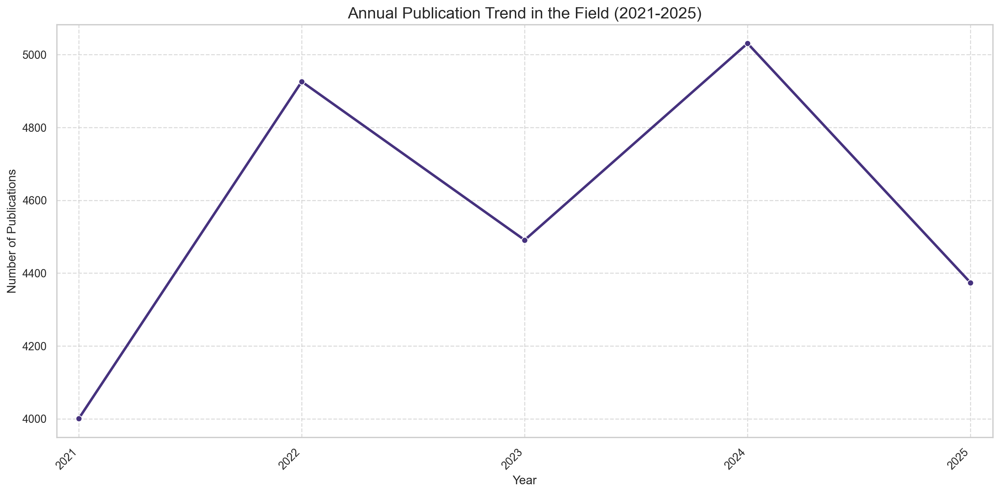

In [20]:
# 导入你的可视化伙伴
import matplotlib.pyplot as plt
import seaborn as sns

# 设置一个好看的绘图风格
sns.set_theme(style="whitegrid", palette="viridis")

# 1. 统计每年的发文量
annual_counts = df_clean['year'].value_counts().sort_index()

# --- 关键修改：筛选出2021到2025年的数据 ---
# 确保你的数据中包含了这些年份。如果数据提前结束，比如只有到2024年，
# 那么2025年就会没有点。
annual_counts_filtered = annual_counts.loc[2021:2025] # 使用 .loc 进行基于标签的切片


# 2. 绘图
plt.figure(figsize=(14, 7),dpi = 200) # 创建一个更宽的图表
# 绘制筛选后的数据
ax = sns.lineplot(x=annual_counts_filtered.index, y=annual_counts_filtered.values, marker='o', lw=2.5)

# --- 美化图表 ---
plt.title('Annual Publication Trend in the Field (2021-2025)', fontsize=16) # 标题也明确一下时间范围
plt.xlabel('Year', fontsize=12)
plt.ylabel('Number of Publications', fontsize=12)

# --- 更精确地设置x轴刻度 ---
# 1. 设置x轴显示范围，确保从2021开始，到2025结束
plt.xlim(2020.9, 2025.1) # 稍微扩展一点点，让首尾的marker能完全显示

# 2. 明确指定刻度位置和标签
# 使用整数列表作为刻度位置和标签
# 注意：如果2025年的数据是部分数据（比如只收集到上半年），
# 那么这个点的数值可能偏低，你需要根据上下文说明。
desired_xticks = [2021, 2022, 2023, 2024, 2025]
plt.xticks(desired_xticks, rotation=45, ha='right') # ha='right' 让标签右对齐刻度

# 移除之前可能引起冲突的 ax.set_xticks
# ax.set_xticks(ax.get_xticks()[::2]) # 这行现在不需要了

# 显示网格（可选，因为 sns.set_theme 已经设置了）
plt.grid(True, linestyle='--', alpha=0.7) 


plt.tight_layout() # 自动调整布局
plt.show()



B. 微观视角：追踪研究热点的演变
目标：挑选出排名前5的热门关键词，并绘制一张多条折线的图表，追踪它们各自在每年的热度（论文数量）变化。

为什么重要：这是本项目的核心洞察之一！它能告诉你：

哪个是“常青树”一样的经典热点？
哪个是近年来迅速崛起的“当红炸子鸡”？
有没有某个曾经的热点正在“退烧”？

--- Tracking the Top 5 Hot Topics: ---
['Gene Expression Regulation, Neoplastic', 'COVID-19', 'SARS-CoV-2', 'Algorithms', 'Cell Proliferation/genetics']


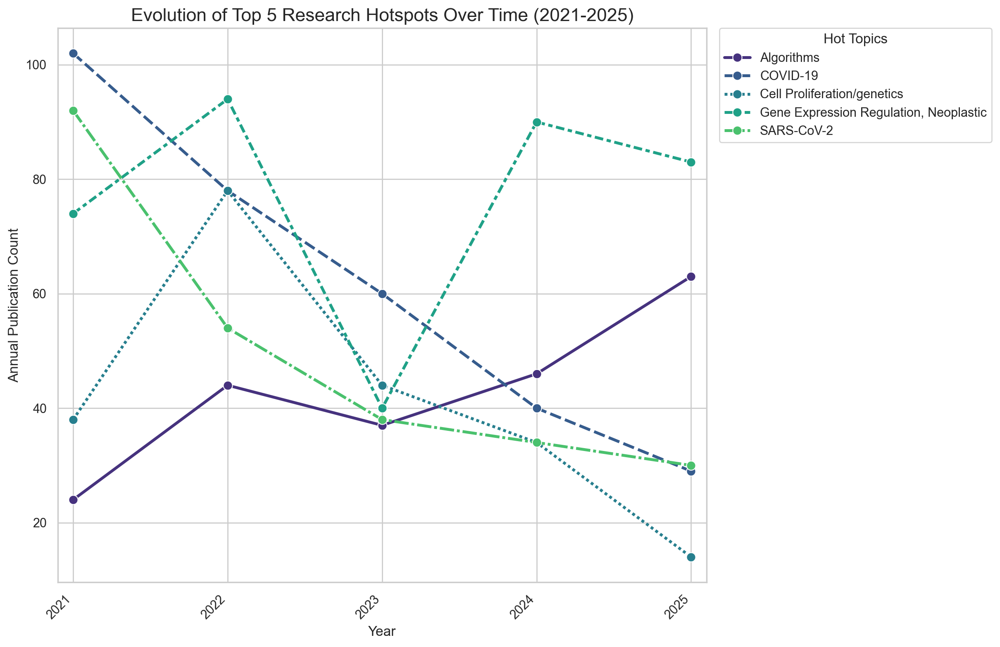

In [21]:
# df_hot_topics 是你上一步创建的关键词计数DataFrame

# 导入必要的库
import matplotlib.pyplot as plt
import seaborn as sns

# 设置一个好看的绘图风格
sns.set_theme(style="whitegrid", palette="viridis") # palette "viridis" 颜色区分度很好

# ====================================================================
# 假设 df_hot_topics 已经存在并包含 'tag' 列和对应的计数
# 如果没有，一个简单的示例 df_hot_topics 创建方法：
# 例如：
# data_mock = {'tag': ['Inflammation', 'Immunotherapy', 'Metabolic Syndrome', 'Microbiome', 'CRISPR'],
#              'count': [500, 450, 400, 380, 350]}
# df_hot_topics = pd.DataFrame(data_mock)
# ====================================================================


# 1. 选出Top N的热门关键词
top_n_tags = 5
top_tags = df_hot_topics['tag'].head(top_n_tags).tolist()
print(f"--- Tracking the Top {top_n_tags} Hot Topics: ---")
print(top_tags)

# 2. 准备用于绘图的数据
# 我们需要一个包含 'year' 和单个 'tag' 的长格式 DataFrame
# 首先，筛选出包含这些top tags的论文
df_exploded_tags = df_clean[['year', 'tags_list']].explode('tags_list').dropna() # 确保处理空值

# 筛选出我们感兴趣的年份范围（2021-2025）
df_exploded_tags_filtered_year = df_exploded_tags[(df_exploded_tags['year'] >= 2021) & (df_exploded_tags['year'] <= 2025)]

# 再筛选出Top N的热门关键词
df_top_tags_trend = df_exploded_tags_filtered_year[df_exploded_tags_filtered_year['tags_list'].isin(top_tags)]

# 3. 按年份和关键词分组计数
# 为了确保每个关键词在每个年份都有数据点（即使为0），可以使用 unstack/stack 填充缺失值
trend_data = df_top_tags_trend.groupby(['year', 'tags_list']).size().unstack(fill_value=0).stack().reset_index(name='count')

# 4. 绘制多条折线图
plt.figure(figsize=(14, 8), dpi=200)
ax = sns.lineplot(data=trend_data, 
                  x='year', 
                  y='count', 
                  hue='tags_list',   # 颜色区分
                  style='tags_list', # !!! 关键改动：线型和标记区分
                  lw=2.5, 
                  marker='o',        # 仍然可以设置一个默认标记（如果style不提供）
                  markersize=8)      # 增加标记大小

# --- 美化图表 ---
plt.title(f'Evolution of Top {top_n_tags} Research Hotspots Over Time (2021-2025)', fontsize=16)
plt.xlabel('Year', fontsize=12)
plt.ylabel('Annual Publication Count', fontsize=12)

# 设置X轴刻度为整数年份，并确保只显示2021-2025
plt.xlim(2020.9, 2025.1) # 略微扩展边界，确保首尾点完整显示
plt.xticks(sorted(trend_data['year'].unique()), rotation=45, ha='right')

# 调整图例位置，避免遮挡数据
plt.legend(title='Hot Topics', bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0) 
plt.tight_layout(rect=[0, 0, 0.88, 1]) # 调整布局，为图例留出空间

plt.show()



In [22]:
# 假设 trend_data 已经通过之前的代码生成，并且已经包含了2021-2025年的数据。
# 确保 top_tags 也已经定义。

# 将 trend_data 从长格式转换为宽格式，以便提取每个关键词的年度数据
pivot_table = trend_data.pivot(index='tags_list', columns='year', values='count').fillna(0)

# 定义我们关心的年份范围，确保顺序正确
years_to_extract = [2021, 2022, 2023, 2024, 2025]

# 提取并生成二维列表
hot_topics_counts_by_year = []
for tag in top_tags:
    # 确保 tag 存在于 pivot_table 的索引中
    if tag in pivot_table.index:
        # 获取该 tag 在指定年份范围内的计数，并转换为整数列表
        counts_for_tag = pivot_table.loc[tag, years_to_extract].astype(int).tolist()
        hot_topics_counts_by_year.append([tag] + counts_for_tag)
    else:
        # 如果某个 top_tag 在数据中没有出现或在过滤后被移除，可以添加一个全零的行
        hot_topics_counts_by_year.append([tag] + [0] * len(years_to_extract))

# 输出结果
print("\n--- Hot Topics Annual Counts (2021-2025) in 2D List Format ---")
print(["Hot Topic"] + years_to_extract) # 打印表头
for row in hot_topics_counts_by_year:
    print(row)




--- Hot Topics Annual Counts (2021-2025) in 2D List Format ---
['Hot Topic', 2021, 2022, 2023, 2024, 2025]
['Gene Expression Regulation, Neoplastic', 74, 94, 40, 90, 83]
['COVID-19', 102, 78, 60, 40, 29]
['SARS-CoV-2', 92, 54, 38, 34, 30]
['Algorithms', 24, 44, 37, 46, 63]
['Cell Proliferation/genetics', 38, 78, 44, 34, 14]


## 第七步：网络分析 - 绘制作者合作关系网络

核心思想非常简单：同一篇论文里的任意两个作者，都算作有一次合作关系。我们将遍历每一篇论文的 authors_list，并为其中的作者两两之间连上一条线（在网络中称为“边”，edge）。

In [23]:
import networkx as nx
from itertools import combinations # 一个能高效生成组合的工具

# df_clean 是我们的主 DataFrame

# 1. 创建一个空的无向图对象
G = nx.Graph()

# 2. 遍历 DataFrame 中的每一行 (每一篇论文)
for index, row in df_clean.iterrows():
    authors = row['authors_list']
    
    #一篇论文至少要有两位作者才能形成合作关系
    if len(authors) > 1:
        # 使用 combinations('ABCD', 2) 会得到 AB AC AD BC BD CD
        # 这正是我们想要的：作者列表中的所有配对
        edges = combinations(authors, 2)
        
        # 将这些代表合作关系的“边”添加到图中
        G.add_edges_from(edges)

# --- 初步检查网络 ---
print("--- 合作网络基本信息 ---")
print(f"网络中共有 {G.number_of_nodes()} 位作者 (节点)")
print(f"他们之间构成了 {G.number_of_edges()} 条合作关系 (边)")


--- 合作网络基本信息 ---
网络中共有 14929 位作者 (节点)
他们之间构成了 654264 条合作关系 (边)


直接绘制整个网络通常会得到一个巨大而混乱的“毛线球”，尤其当作者数量成千上万时。一个聪明的策略是，只绘制网络的核心部分。

在网络科学中，这个核心部分通常指“最大连通分量”（The Largest Connected Component）——也就是网络中最大的那个相互连接的子群体。

### 1.0版本

因为太耗时，而且没有任何用，全部注释掉

In [24]:
# # 1. 找到所有连通分量，并找出最大的那个
# # 连通分量是网络中的子图，子图中的任意两点都相互连通
# components = nx.connected_components(G)
# largest_cc = max(components, key=len)
# G_core = G.subgraph(largest_cc)

# print(f"\n--- 核心社群网络信息 ---")
# print(f"核心网络包含 {G_core.number_of_nodes()} 位作者")
# print(f"他们之间的合作关系有 {G_core.number_of_edges()} 条")


# # 2. 绘图！这可能需要一点时间来计算布局
# plt.figure(figsize=(15, 15))

# # 使用 spring_layout 布局算法，它会模拟物理上的引力和斥力让图更美观
# # k值可以调整节点间的距离, iterations可以增加迭代次数让布局更好
# pos = nx.spring_layout(G_core, k=0.15, iterations=50)

# # 为了让图更清晰，我们可以根据节点的重要性（连接数）来调整大小
# degrees = dict(G_core.degree())
# node_sizes = [v * 20 + 20 for v in degrees.values()] # 基础大小20，再根据连接数放大

# nx.draw(G_core, 
#         pos,
#         with_labels=True,      # 显示作者标签
#         node_size=node_sizes,  # 设置节点大小
#         node_color='#3498db',  # 节点颜色
#         edge_color='#bdc3c7',  # 边的颜色
#         font_size=8,           # 字体大小
#         font_color='#2c3e50'   # 字体颜色
#        )

# plt.title('Author Collaboration Network (Core Community)', fontsize=20)
# plt.show()


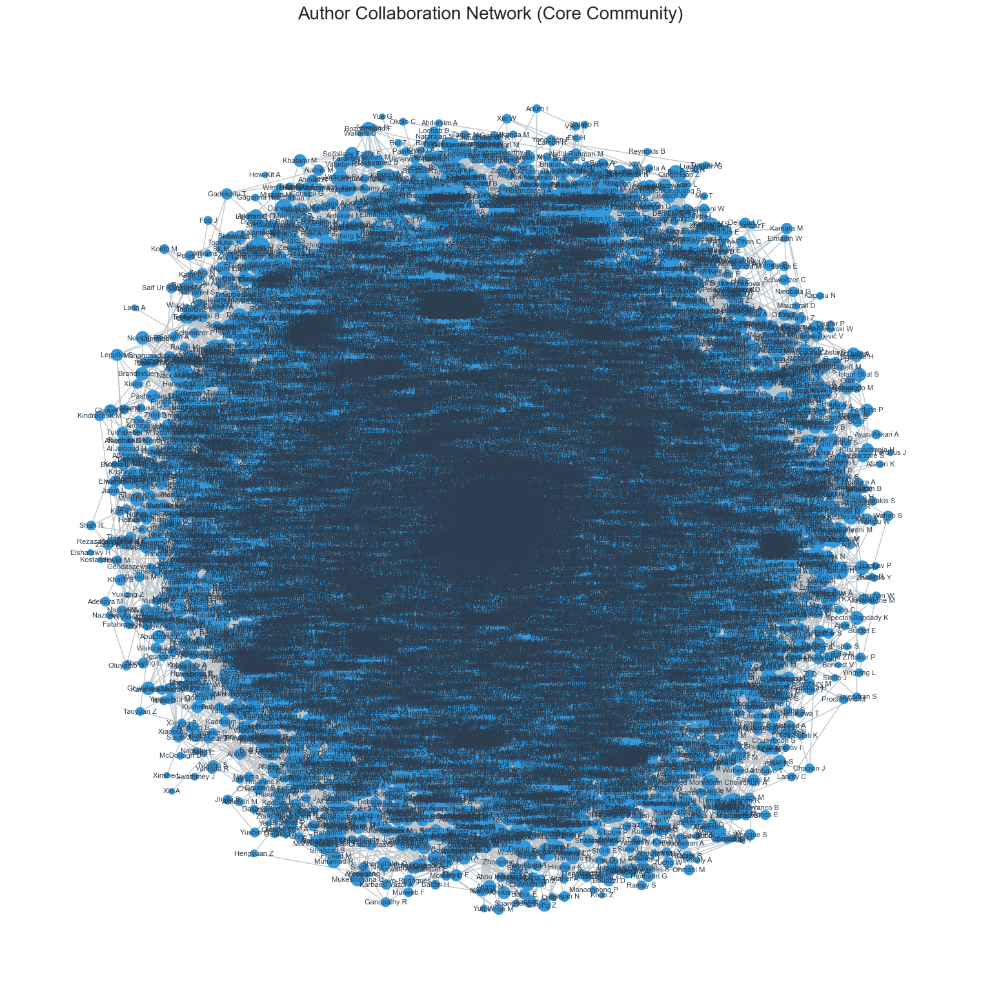

发现记录太多，再次“核心化”

我们将采用两种过滤方式，双管齐下：

- 节点过滤 (Node Filtering)：只保留最重要的作者。什么最重要？我们可以定义一个标准，比如：只保留合作关系数量（度，degree）排在前100或前200位的作者。这些是网络中的“超级连接者”。
- 边过滤 (Edge Filtering)：只保留最强的合作关系。一次合作和十次合作的意义是不同的。我们将给每一条“边”加上权重（weight），代表两位作者合作的论文次数，然后只显示权重高于某个阈值的边（比如至少合作过3次以上）。

In [25]:
from collections import Counter
from itertools import combinations
import networkx as nx
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 这里我们不用 G，而是创建一个全新的带权重的图 G_weighted
G_weighted = nx.Graph()
all_edges = []

# 遍历每一篇论文，收集所有的合作配对
for index, row in df_clean.iterrows():
    authors = row['authors_list']
    if len(authors) > 1:
        # 为了让 (A,B) 和 (B,A) 被视作同一个，我们先排序
        sorted_authors = sorted(authors)
        # 生成配对
        edges = combinations(sorted_authors, 2)
        all_edges.extend(list(edges))

# 使用 Counter 一次性统计所有配对的出现次数
edge_weights = Counter(all_edges)

# 将带权重的边添加到新图中
for edge, weight in edge_weights.items():
    author1, author2 = edge
    G_weighted.add_edge(author1, author2, weight=weight)

print("--- 加权网络构建完成 ---")
print(f"网络中共有 {G_weighted.number_of_nodes()} 位作者")
print(f"他们之间构成了 {G_weighted.number_of_edges()} 条独特的合作关系")


--- 加权网络构建完成 ---
网络中共有 14929 位作者
他们之间构成了 654264 条独特的合作关系


In [26]:
# --- 设定你的过滤阈值 ---
# 1. 节点度阈值：一个作者至少要有多少个合作者才被保留？
top_n_authors = 50 # 我们也可以按排名来，比如只保留度最高的前100位作者
degrees = dict(G_weighted.degree())
sorted_degrees = sorted(degrees.items(), key=lambda item: item[1], reverse=True)
core_authors = [author for author, degree in sorted_degrees[:top_n_authors]]

# 2. 边权重阈值：两个作者至少合作几次才显示连接？
WEIGHT_THRESHOLD = 3 # 至少合作3次

# --- 开始过滤 ---
# 创建一个最终用于可视化的图
G_core_strong = nx.Graph()

for author1, author2, data in G_weighted.edges(data=True):
    # 条件1: 两个作者都必须是核心作者
    # 条件2: 他们的合作次数必须达到阈值
    if author1 in core_authors and author2 in core_authors and data['weight'] >= WEIGHT_THRESHOLD:
        G_core_strong.add_edge(author1, author2, weight=data['weight'])

print(f"\n--- 过滤后的核心星座网络 ---")
print(f"核心网络包含 {G_core_strong.number_of_nodes()} 位顶尖作者")
print(f"他们之间的强连接关系有 {G_core_strong.number_of_edges()} 条")



--- 过滤后的核心星座网络 ---
核心网络包含 50 位顶尖作者
他们之间的强连接关系有 1275 条


### 2.0版本

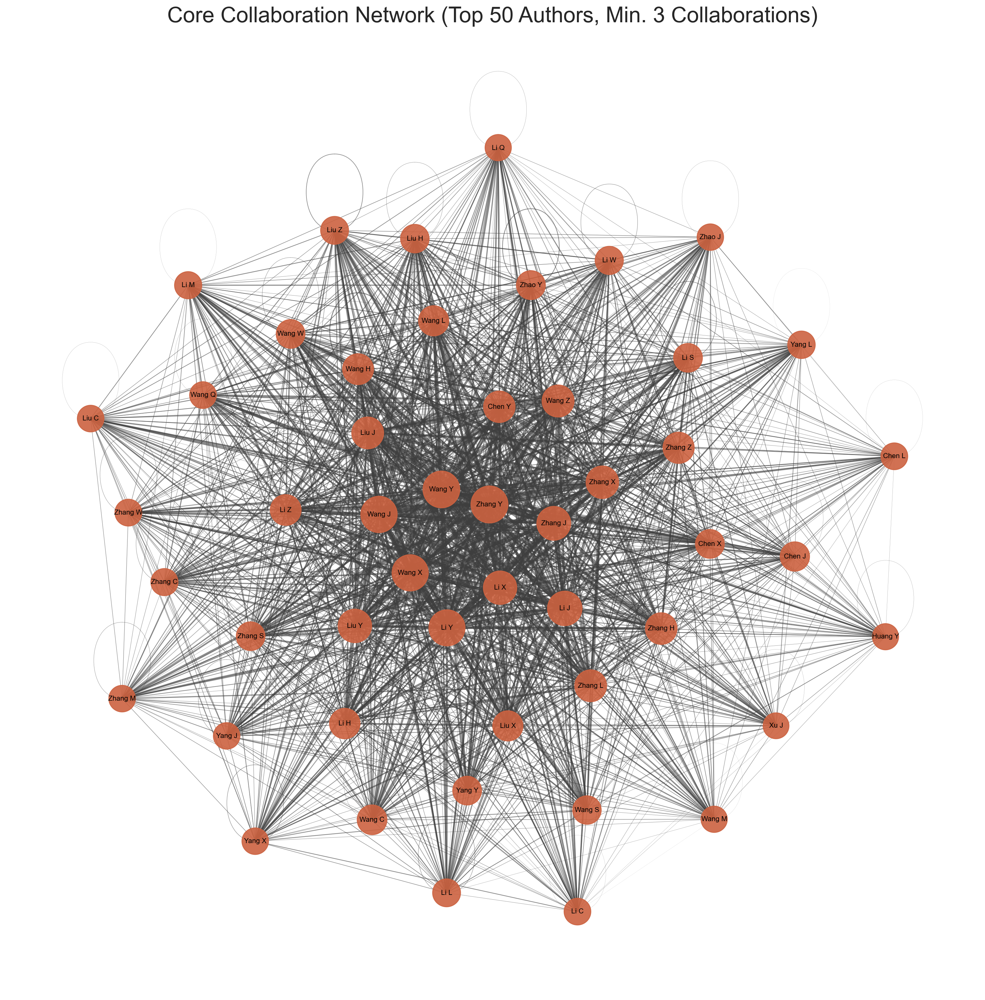

In [27]:
# =====================================================================
# 更新后的可视化代码块 (节点已缩小)
# =====================================================================

if G_core_strong.number_of_nodes() > 0:
    plt.figure(figsize=(20, 20),dpi = 200)

    # 布局算法 (保持不变)
    pos = nx.spring_layout(G_core_strong, k=0.8, iterations=50, seed=42)

    # --- 关键修改在这里 ---
    # 节点大小：减小了基础大小和缩放因子
    original_degrees = {node: degrees.get(node, 0) for node in G_core_strong.nodes()}
    # NEW: Smaller node size calculation
    node_sizes = [v * 0.5 + 20 for v in original_degrees.values()]

    # 边的宽度 (可以保持不变，也可以适当调细一点，比如乘以0.6)
    edge_widths = [d['weight'] * 0.02 for (u, v, d) in G_core_strong.edges(data=True)]
    
    # 字体大小也可以适当调整以匹配更小的节点
    label_font_size = 8

    nx.draw_networkx_nodes(G_core_strong, pos, 
                           node_size=node_sizes, 
                           node_color='#cc6240', 
                           alpha=0.9) # 稍微调高一点透明度让颜色更实
                           
    nx.draw_networkx_edges(G_core_strong, pos, 
                           width=edge_widths, 
                           edge_color='#3e3e3e', 
                           alpha=0.6)
                           
    nx.draw_networkx_labels(G_core_strong, pos, 
                            font_size=label_font_size, # 使用调整后的字体大小
                            font_color='#000000')

    plt.title(f'Core Collaboration Network (Top {top_n_authors} Authors, Min. {WEIGHT_THRESHOLD} Collaborations)', fontsize=25)
    plt.axis('off')
    plt.show()

else:
    print("\n在当前阈值下，没有形成任何连接。请尝试降低阈值。")


## 终极篇章：关键词共现网络 - 绘制你所在领域的知识图谱

- 识别研究主题：紧密相连的关键词群组，直接对应着领域内的主要研究方向或主题。例如，你可能会发现一个由“深度学习”、“卷积神经网络”、“图像识别”构成的紧密集群。
- 发现领域核心与前沿：网络中心的大节点通常是该领域最核心、最基础的概念。而处于网络边缘或连接不同集群的节点，则可能是新兴的、交叉的或前沿的研究方向。
- 理解知识结构：这张图告诉你，你所在领域的知识是如何组织起来的。哪些概念是基石？哪些是热门应用？哪些是连接不同思想的桥梁？

In [28]:
# =====================================================================
# 步骤 1 & 2: 构建一个*已过滤*的共现网络
# =====================================================================
from collections import Counter
from itertools import combinations
import networkx as nx

# --- 计算过滤后的总频率 (用于节点大小) ---
all_tags_lists = df_clean['tags_list'].dropna().tolist()
# 展开所有列表，并在此处进行过滤
filtered_all_tags = [
    tag for tags_list in all_tags_lists 
    for tag in tags_list 
    if tag not in domain_stop_words
]
tag_frequencies = Counter(filtered_all_tags)

print("--- (过滤后) Top 10 Most Frequent Keywords ---")
print(tag_frequencies.most_common(10))


--- (过滤后) Top 10 Most Frequent Keywords ---
[('Gene Expression Regulation, Neoplastic', 381), ('COVID-19', 309), ('SARS-CoV-2', 248), ('Algorithms', 214), ('Cell Proliferation/genetics', 208), ('Reactive Oxygen Species/metabolism', 196), ('Biomarkers', 184), ('Tumor Microenvironment', 173), ('*MicroRNAs/genetics/metabolism', 171), ('Polymorphism, Single Nucleotide', 169)]


In [29]:
# --- 构建过滤后的加权图 (用于边和连接) ---
G_keywords_weighted = nx.Graph()

for tags_list in all_tags_lists:
    # 对每一篇论文的关键词列表进行过滤
    filtered_tags = [tag for tag in tags_list if tag not in domain_stop_words]
    
    # 确保过滤后仍有两个以上关键词才能形成共现
    if len(filtered_tags) > 1:
        # 排序以确保 ('A', 'B') 和 ('B', 'A') 被视为一样
        sorted_tags = sorted(filtered_tags)
        edges = combinations(sorted_tags, 2)
        
        # 直接增加边的权重
        for edge in edges:
            if G_keywords_weighted.has_edge(*edge):
                G_keywords_weighted[edge[0]][edge[1]]['weight'] += 1
            else:
                G_keywords_weighted.add_edge(edge[0], edge[1], weight=1)

print(f"\n--- (过滤后) 关键词共现网络构建完成 ---")
print(f"网络中共有 {G_keywords_weighted.number_of_nodes()} 个独特的关键词")
print(f"它们之间构成了 {G_keywords_weighted.number_of_edges()} 条共现关系")





--- (过滤后) 关键词共现网络构建完成 ---
网络中共有 86371 个独特的关键词
它们之间构成了 769870 条共现关系



--- 过滤后的核心知识图谱 ---
核心网络包含 47 个核心概念
它们之间的强连接关系有 133 条


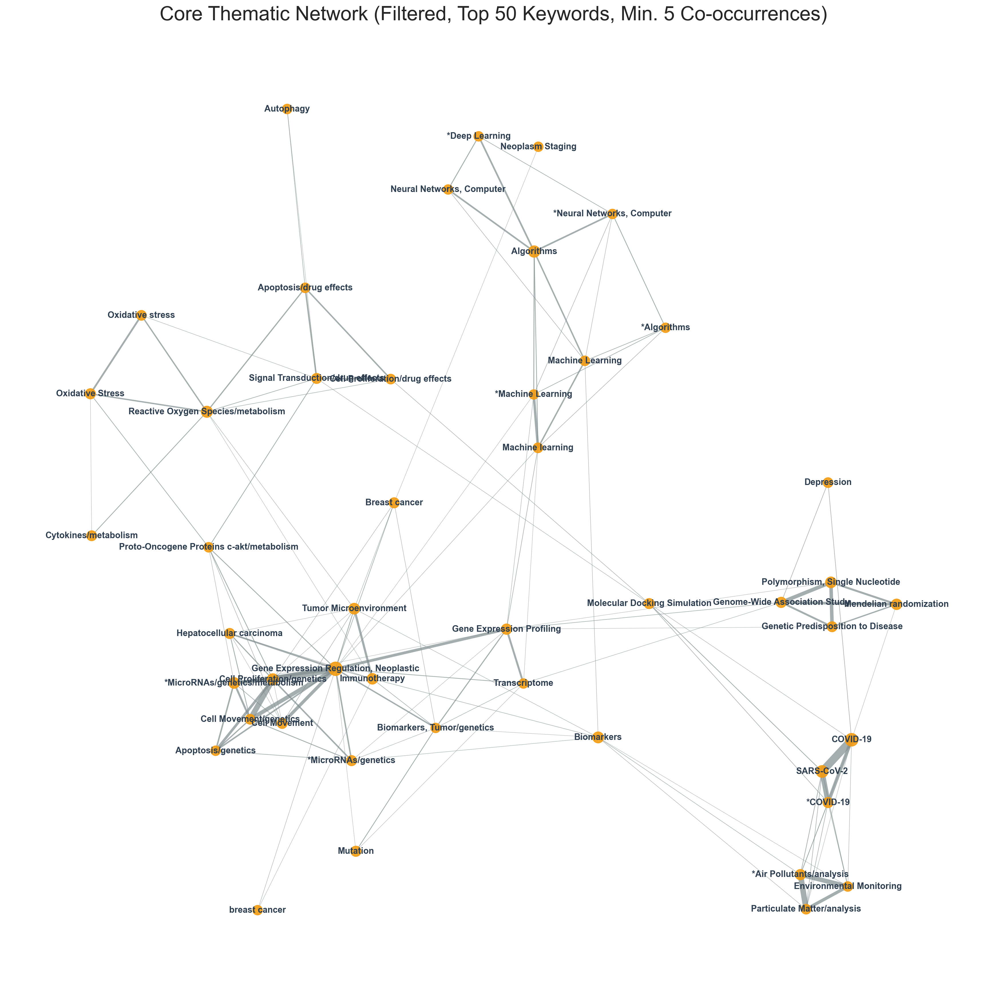

In [30]:
# =====================================================================
# 步骤 3 & 4: 聚焦并可视化核心知识图谱
# =====================================================================

# --- 设定你的过滤阈值 (现在可以对真正的热点词进行筛选) ---
TOP_N_KEYWORDS = 50 
KEYWORD_WEIGHT_THRESHOLD = 5 # 由于总词数变少，你可能需要适当降低这个阈值

# --- 开始过滤 ---
# 这里的 tag_frequencies 已经是过滤后的了，所以选出的都是有意义的核心词
if tag_frequencies: # 确保不为空
    core_keywords = [tag for tag, freq in tag_frequencies.most_common(TOP_N_KEYWORDS)]
else:
    core_keywords = []


G_keywords_core = nx.Graph()
if core_keywords:
    # 从已经过滤的 G_keywords_weighted 中提取子图
    G_keywords_core = G_keywords_weighted.subgraph(core_keywords).copy()

    # 再根据边的权重做第二次过滤
    edges_to_remove = [
        (u, v) for u, v, d in G_keywords_core.edges(data=True) 
        if d['weight'] < KEYWORD_WEIGHT_THRESHOLD
    ]
    G_keywords_core.remove_edges_from(edges_to_remove)
    # 移除孤立节点
    G_keywords_core.remove_nodes_from(list(nx.isolates(G_keywords_core)))


print(f"\n--- 过滤后的核心知识图谱 ---")
print(f"核心网络包含 {G_keywords_core.number_of_nodes()} 个核心概念")
print(f"它们之间的强连接关系有 {G_keywords_core.number_of_edges()} 条")


# --- 可视化 ---
if G_keywords_core.number_of_nodes() > 0:
    plt.figure(figsize=(22, 22),dpi = 200)
    pos = nx.spring_layout(G_keywords_core, k=1.0, iterations=50, seed=42) # k值可以调大一点让节点更分散

    # 节点大小：基于过滤后的总频率
    node_sizes = [tag_frequencies.get(node, 0) * 0.5 + 100 for node in G_keywords_core.nodes()]

    # 边的宽度
    edge_widths = [d['weight'] * 0.08 for (u, v, d) in G_keywords_core.edges(data=True)]

    nx.draw_networkx_nodes(G_keywords_core, pos, node_size=node_sizes, node_color='#f39c12', alpha=0.9)
    nx.draw_networkx_edges(G_keywords_core, pos, width=edge_widths, edge_color='#7f8c8d', alpha=0.7)
    nx.draw_networkx_labels(G_keywords_core, pos, font_size=11, font_color='#2c3e50', font_weight='bold')

    plt.title(f'Core Thematic Network (Filtered, Top {TOP_N_KEYWORDS} Keywords, Min. {KEYWORD_WEIGHT_THRESHOLD} Co-occurrences)', fontsize=25)
    plt.axis('off')
    plt.show()
else:
    print("\n在当前阈值下，没有形成任何连接。请尝试调整 TOP_N_KEYWORDS 和 KEYWORD_WEIGHT_THRESHOLD。")




In [31]:
# 承接你提供的代码段，这段代码应该放在可视化部分之前或之后，但为了逻辑清晰，放在 `print(f"核心网络包含 ...")` 之后。

print("\n--- 核心知识图谱的共现数据 (Co-occurrence Data) ---")
# 创建一个列表来存储共现关系的详细信息
cooccurrence_data = []
# 遍历图中的所有边及其属性
for u, v, data in G_keywords_core.edges(data=True):
    cooccurrence_data.append([u, v, data['weight']])

# 将列表转换为Pandas DataFrame以便更好地展示
if cooccurrence_data:
    df_cooccurrence = pd.DataFrame(cooccurrence_data, columns=['Keyword 1', 'Keyword 2', 'Co-occurrence Weight'])
    
    # 按照共现权重降序排序，更容易看到最强的关系
    df_cooccurrence = df_cooccurrence.sort_values(by='Co-occurrence Weight', ascending=False)
    
    # 打印DataFrame，可以根据需要调整显示行数
    print(df_cooccurrence.to_string()) # to_string() 避免在控制台输出时被截断
else:
    print("当前过滤条件下，核心知识图谱中没有共现边。")




--- 核心知识图谱的共现数据 (Co-occurrence Data) ---
                                    Keyword 1                                 Keyword 2  Co-occurrence Weight
21                                   COVID-19                                SARS-CoV-2                   122
33                Cell Proliferation/genetics    Gene Expression Regulation, Neoplastic                   103
71                Particulate Matter/analysis                  *Air Pollutants/analysis                    87
30                Cell Proliferation/genetics                    Cell Movement/genetics                    85
56                                 SARS-CoV-2                                 *COVID-19                    78
88                   *Air Pollutants/analysis                  Environmental Monitoring                    70
117                    Cell Movement/genetics    Gene Expression Regulation, Neoplastic                    61
114             Genome-Wide Association Study           Polymorphism, Single N

## 导出VOSviewer可用的格式

In [32]:
# =====================================================================
# 假设 G_keywords_weighted 和 tag_frequencies 已经存在于你的环境中
# 如果没有，你需要先运行生成这些变量的代码
# =====================================================================

print("\n--- 正在导出数据为 VOSviewer 格式 ---")

# --- 1. 准备节点数据 ---
# 获取网络中的所有节点（关键词）
all_keywords = list(G_keywords_weighted.nodes())
if not all_keywords:
    print("错误：关键词共现网络中没有节点，无法导出。请检查你的过滤阈值。")
else:
    # 为每个关键词创建一个从1开始的唯一ID
    # VOSviewer 通常使用 1-based index
    keyword_to_id = {keyword: i + 1 for i, keyword in enumerate(all_keywords)}

    # --- 2. 创建 Map File (vosviewer_map.txt) ---
    map_filename = 'vosviewer_map.txt'
    with open(map_filename, 'w', encoding='utf-8') as f:
        # 写入VOSviewer识别的表头
        # 'id' 和 'label' 是必需的
        # 'weight' 是可选但非常有用的，我们可以用总词频作为节点的权重
        f.write("id\tlabel\tweight\n")
        
        for keyword in all_keywords:
            node_id = keyword_to_id[keyword]
            label = keyword
            # 从 tag_frequencies 获取该关键词的总出现次数作为其权重
            weight = tag_frequencies.get(label, 1) # 如果找不到，默认为1
            
            f.write(f"{node_id}\t{label}\t{weight}\n")
            
    print(f"成功创建 Map File: '{map_filename}'")
    print(f"文件中包含 {len(all_keywords)} 个节点（关键词）。")


    # --- 3. 创建 Network File (vosviewer_network.txt) ---
    network_filename = 'vosviewer_network.txt'
    with open(network_filename, 'w', encoding='utf-8') as f:
        # 网络文件没有表头，格式为：start_node_id, end_node_id, weight
        for u, v, data in G_keywords_weighted.edges(data=True):
            start_id = keyword_to_id[u]
            end_id = keyword_to_id[v]
            link_strength = data['weight'] # 共现权重
            
            f.write(f"{start_id}\t{end_id}\t{link_strength}\n")

    print(f"成功创建 Network File: '{network_filename}'")
    print(f"文件中包含 {G_keywords_weighted.number_of_edges()} 条边（共现关系）。")




--- 正在导出数据为 VOSviewer 格式 ---
成功创建 Map File: 'vosviewer_map.txt'
文件中包含 86371 个节点（关键词）。
成功创建 Network File: 'vosviewer_network.txt'
文件中包含 769870 条边（共现关系）。
